In [6]:
%load_ext autoreload
%autoreload 2
import scqubits as sq
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import differential_evolution
import os
from utilities import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
period = 3.02 # V
voltage_center = 1.455 # V

experimental_points = np.array([
    #level, flux, frequeny
    (1, 0, 6.8843),
    (2, 0, 6.8900),
    (2, 0.1092, 8.38),
    (1, 0.036, 6.3936),
    (2, (1.945-voltage_center)/period, 9.10),
    (2, (2.1509-voltage_center)/period, 10.01165),
    (3, (2.58-voltage_center)/period, 11.94),
    (4, (2.58-voltage_center)/period, 12),
    (2, (2.234-voltage_center)/period, 9.89),
    (2, (2.241-voltage_center)/period, 9.8616),
])

In [8]:
def minimizer(params):
    EJ,EC,EL = params
    fluxonium = sq.Fluxonium(EJ=EJ,EC=EC,EL=EL,flux=0,cutoff=40)
    val = fluxonium.get_spectrum_vs_paramvals(param_name='flux',param_vals=experimental_points[:,1], evals_count=5, subtract_ground=True)
    
    cost_function = np.sqrt(np.sum((val.energy_table[np.arange(len(experimental_points)),experimental_points[:,0].astype(int)] - experimental_points[:,2])**2))/len(experimental_points)
    
    return cost_function   

In [ ]:
bounds_list = [
    (7,15),
    (1,4),
    (0.1,0.6)
]
result = differential_evolution(func=minimizer,bounds=bounds_list)

In [10]:
result

 message: Optimization terminated successfully.
 success: True
     fun: 0.020986414650897605
       x: [ 1.003e+01  1.811e+00  3.687e-01]
     nit: 23
    nfev: 1144
     jac: [ 1.223e-06  2.314e-06 -5.450e-06]

Spectral data:   0%|          | 0/301 [00:00<?, ?it/s]

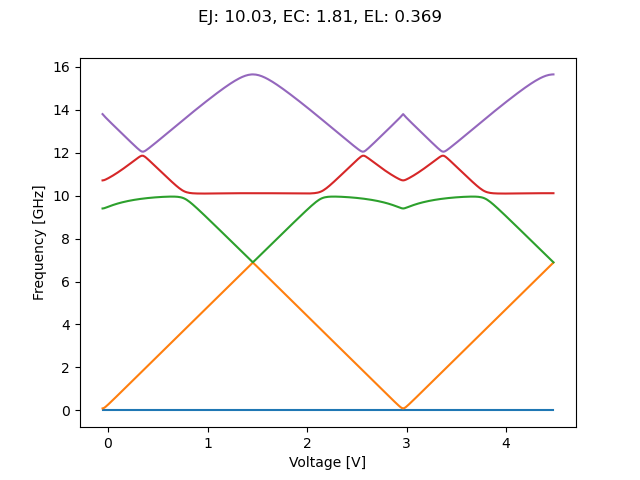

In [15]:
EJ,EC,EL = result.x
fluxonium = sq.Fluxonium(EJ,EC,EL,flux=0, cutoff=40)

flux_array =np.linspace(-0.5,1,301)
evals = fluxonium.get_spectrum_vs_paramvals(param_name='flux',param_vals=flux_array,evals_count=5,subtract_ground=True)

plt.close('all')
%matplotlib widget
fig,ax = plt.subplots(1,1)
plt.suptitle(f"EJ: {np.round(EJ,2)}, EC: {np.round(EC,2)}, EL: {np.round(EL,3)}")
ax.plot(flux_array*period + voltage_center, evals.energy_table)
ax.set_xlabel('Voltage [V]')
ax.set_ylabel('Frequency [GHz]')
plt.show()

Data processing

In [3]:
# Example usage
base_name = 'data_temp/FBW10S4_204062'
x_values, y_values, phase_values = load_data(base_name)

# Create a phase matrix for plotting
phase_matrix = np.array(phase_values).T

# Remove column offsets
adjusted_phase_matrix_columns = remove_column_offsets(phase_matrix)

# Remove row offsets
adjusted_phase_matrix_rows = remove_row_offsets(phase_matrix)
plt.close('all')
# Plot the phase map with column offsets removed
plot_phase_map(x_values, y_values, adjusted_phase_matrix_rows, title='Phase Map with Column Offsets Removed')

In [98]:
# Ruta al directorio con los archivos de Y y Z
directory = 'data_temp/FBW10S4_204062'

# Cargar datos del eje Y y la fase desde todos los archivos en el directorio
x_values, y_values, phase_values = load_data(directory)

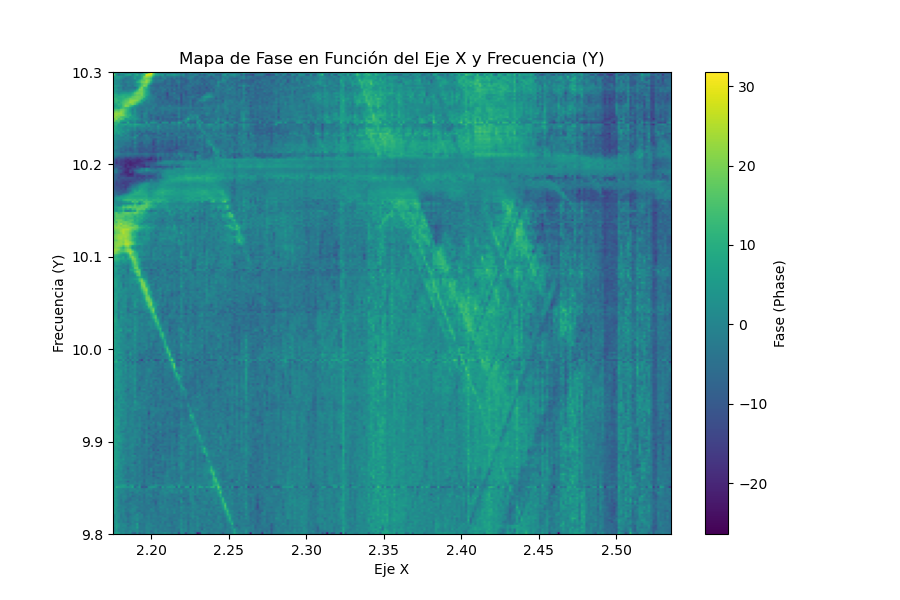

In [104]:
# Graficar los datos en 2D
plt.figure(figsize=(9, 6))

# Crear una matriz de fases para el plot
phase_matrix = np.array(phase_values)

# Graficar la fase como una imagen
plt.imshow(remove_column_offsets(phase_matrix).T, aspect='auto',origin="lower", extent=[x_values[0],x_values[-1], min(y_values[0]), max(y_values[0])], cmap='viridis')
# plt.imshow(phase_matrix.T, aspect='auto',origin="lower", extent=[x_values[0],x_values[-1], min(y_values[0]), max(y_values[0])], cmap='viridis')
plt.colorbar(label='Fase (Phase)')
plt.title('Mapa de Fase en Función del Eje X y Frecuencia (Y)')
plt.xlabel('Eje X')
plt.ylabel('Frecuencia (Y)')
plt.show()

In [16]:
# Ruta al archivo del eje X
x_file = 'data_temp/FBW10S4_204062.txt'
# Cargar datos del eje X
x_values = load_x_data(x_file)
print(x_values)


[2.175  2.1765 2.178  2.1795 2.181  2.1825 2.184  2.1855 2.187  2.1885
 2.19   2.1915 2.193  2.1945 2.196  2.1975 2.199  2.2005 2.202  2.2035
 2.205  2.2065 2.208  2.2095 2.211  2.2125 2.214  2.2155 2.217  2.2185
 2.22   2.2215 2.223  2.2245 2.226  2.2275 2.229  2.2305 2.232  2.2335
 2.235  2.2365 2.238  2.2395 2.241  2.2425 2.244  2.2455 2.247  2.2485
 2.25   2.2515 2.253  2.2545 2.256  2.2575 2.259  2.2605 2.262  2.2635
 2.265  2.2665 2.268  2.2695 2.271  2.2725 2.274  2.2755 2.277  2.2785
 2.28   2.2815 2.283  2.2845 2.286  2.2875 2.289  2.2905 2.292  2.2935
 2.295  2.2965 2.298  2.2995 2.301  2.3025 2.304  2.3055 2.307  2.3085
 2.31   2.3115 2.313  2.3145 2.316  2.3175 2.319  2.3205 2.322  2.3235
 2.325  2.3265 2.328  2.3295 2.331  2.3325 2.334  2.3355 2.337  2.3385
 2.34   2.3415 2.343  2.3445 2.346  2.3475 2.349  2.3505 2.352  2.3535
 2.355  2.3565 2.358  2.3595 2.361  2.3625 2.364  2.3655 2.367  2.3685
 2.37   2.3715 2.373  2.3745 2.376  2.3775 2.379  2.3805 2.382  2.3835
 2.385

In [14]:
x_values

array([2.175 , 2.1765, 2.178 , 2.1795, 2.181 , 2.1825, 2.184 , 2.1855,
       2.187 , 2.1885, 2.19  , 2.1915, 2.193 , 2.1945, 2.196 , 2.1975,
       2.199 , 2.2005, 2.202 , 2.2035, 2.205 , 2.2065, 2.208 , 2.2095,
       2.211 , 2.2125, 2.214 , 2.2155, 2.217 , 2.2185, 2.22  , 2.2215,
       2.223 , 2.2245, 2.226 , 2.2275, 2.229 , 2.2305, 2.232 , 2.2335,
       2.235 , 2.2365, 2.238 , 2.2395, 2.241 , 2.2425, 2.244 , 2.2455,
       2.247 , 2.2485, 2.25  , 2.2515, 2.253 , 2.2545, 2.256 , 2.2575,
       2.259 , 2.2605, 2.262 , 2.2635, 2.265 , 2.2665, 2.268 , 2.2695,
       2.271 , 2.2725, 2.274 , 2.2755, 2.277 , 2.2785, 2.28  , 2.2815,
       2.283 , 2.2845, 2.286 , 2.2875, 2.289 , 2.2905, 2.292 , 2.2935,
       2.295 , 2.2965, 2.298 , 2.2995, 2.301 , 2.3025, 2.304 , 2.3055,
       2.307 , 2.3085, 2.31  , 2.3115, 2.313 , 2.3145, 2.316 , 2.3175,
       2.319 , 2.3205, 2.322 , 2.3235, 2.325 , 2.3265, 2.328 , 2.3295,
       2.331 , 2.3325, 2.334 , 2.3355, 2.337 , 2.3385, 2.34  , 2.3415,
      

In [ ]:
fig, ax = plt.subplots(1,1)
ax.imshow()